# Deep Convolutional GANs

In this notebook, you'll build a GAN using convolutional layers in the generator and discriminator. This is called a Deep Convolutional GAN, or DCGAN for short. The DCGAN architecture was first explored last year and has seen impressive results in generating new images, you can read the [original paper here](https://arxiv.org/pdf/1511.06434.pdf).

You'll be training DCGAN on the [Street View House Numbers](http://ufldl.stanford.edu/housenumbers/) (SVHN) dataset. These are color images of house numbers collected from Google street view. SVHN images are in color and much more variable than MNIST. 

![SVHN Examples](assets/SVHN_examples.png)

So, we'll need a deeper and more powerful network. This is accomplished through using convolutional layers in the discriminator and generator. It's also necessary to use batch normalization to get the convolutional networks to train. The only real changes compared to what [you saw previously](https://github.com/udacity/deep-learning/tree/master/gan_mnist) are in the generator and discriminator, otherwise the rest of the implementation is the same.

In [1]:
%matplotlib inline

import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
from scipy.io import loadmat
import tensorflow as tf

In [2]:
!mkdir data

mkdir: data: File exists


## Getting the data

Here you can download the SVHN dataset. Run the cell above and it'll download to your machine.

In [3]:
from urllib.request import urlretrieve
from os.path import isfile, isdir
from tqdm import tqdm

data_dir = 'data/'

if not isdir(data_dir):
    raise Exception("Data directory doesn't exist!")

class DLProgress(tqdm):
    last_block = 0

    def hook(self, block_num=1, block_size=1, total_size=None):
        self.total = total_size
        self.update((block_num - self.last_block) * block_size)
        self.last_block = block_num

if not isfile(data_dir + "train_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Training Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/train_32x32.mat',
            data_dir + 'train_32x32.mat',
            pbar.hook)

if not isfile(data_dir + "test_32x32.mat"):
    with DLProgress(unit='B', unit_scale=True, miniters=1, desc='SVHN Testing Set') as pbar:
        urlretrieve(
            'http://ufldl.stanford.edu/housenumbers/test_32x32.mat',
            data_dir + 'test_32x32.mat',
            pbar.hook)

These SVHN files are `.mat` files typically used with Matlab. However, we can load them in with `scipy.io.loadmat` which we imported above.

In [4]:
trainset = loadmat(data_dir + 'train_32x32.mat')
testset = loadmat(data_dir + 'test_32x32.mat')

Here I'm showing a small sample of the images. Each of these is 32x32 with 3 color channels (RGB). These are the real images we'll pass to the discriminator and what the generator will eventually fake.

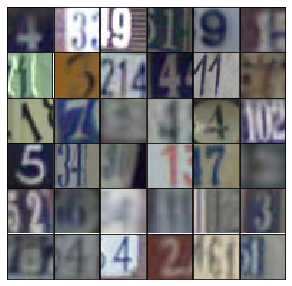

In [5]:
idx = np.random.randint(0, trainset['X'].shape[3], size=36)
fig, axes = plt.subplots(6, 6, sharex=True, sharey=True, figsize=(5,5),)
for ii, ax in zip(idx, axes.flatten()):
    ax.imshow(trainset['X'][:,:,:,ii], aspect='equal')
    ax.xaxis.set_visible(False)
    ax.yaxis.set_visible(False)
plt.subplots_adjust(wspace=0, hspace=0)

Here we need to do a bit of preprocessing and getting the images into a form where we can pass batches to the network. First off, we need to rescale the images to a range of -1 to 1, since the output of our generator is also in that range. We also have a set of test and validation images which could be used if we're trying to identify the numbers in the images.

In [6]:
def scale(x, feature_range=(-1, 1)):
    
    # scale to (0, 1)
    x = ((x - x.min())/(255 - x.min()))
    
    # scale to feature_range
    min, max = feature_range
    x = x * (max - min) + min
    return x

In [7]:
class Dataset:
    def __init__(self, train, test, val_frac=0.5, shuffle=False, scale_func=None):
        split_idx = int(len(test['y'])*(1 - val_frac))
        self.test_x, self.valid_x = test['X'][:,:,:,:split_idx], test['X'][:,:,:,split_idx:]
        self.test_y, self.valid_y = test['y'][:split_idx], test['y'][split_idx:]
        self.train_x, self.train_y = train['X'], train['y']
        
        self.train_x = np.rollaxis(self.train_x, 3)
        self.valid_x = np.rollaxis(self.valid_x, 3)
        self.test_x = np.rollaxis(self.test_x, 3)
        
        if scale_func is None:
            self.scaler = scale
        else:
            self.scaler = scale_func
        self.shuffle = shuffle
        
    def batches(self, batch_size):
        if self.shuffle:
            idx = np.arange(len(dataset.train_x))
            np.random.shuffle(idx)
            self.train_x = self.train_x[idx]
            self.train_y = self.train_y[idx]
        
        n_batches = len(self.train_y)//batch_size
        for ii in range(0, len(self.train_y), batch_size):
            x = self.train_x[ii:ii+batch_size]
            y = self.train_y[ii:ii+batch_size]
            
            yield self.scaler(x), y

## Network Inputs

Here, just creating some placeholders like normal.

In [8]:
def model_inputs(real_dim, z_dim):
    inputs_real = tf.placeholder(tf.float32, (None, *real_dim), name='input_real')
    inputs_z = tf.placeholder(tf.float32, (None, z_dim), name='input_z')
    
    return inputs_real, inputs_z

## Generator

Here you'll build the generator network. The input will be our noise vector `z` as before. Also as before, the output will be a $tanh$ output, but this time with size 32x32 which is the size of our SVHN images.

What's new here is we'll use convolutional layers to create our new images. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, something like 4x4x1024 as in the original DCGAN paper. Then we use batch normalization and a leaky ReLU activation. Next is a transposed convolution where typically you'd halve the depth and double the width and height of the previous layer. Again, we use batch normalization and leaky ReLU. For each of these layers, the general scheme is convolution > batch norm > leaky ReLU.

You keep stacking layers up like this until you get the final transposed convolution layer with shape 32x32x3. Below is the archicture used in the original DCGAN paper:

![DCGAN Generator](assets/dcgan.png)

Note that the final layer here is 64x64x3, while for our SVHN dataset, we only want it to be 32x32x3. 

>**Exercise:** Build the transposed convolutional network for the generator in the function below. Be sure to use leaky ReLUs on all the layers except for the last tanh layer, as well as batch normalization on all the transposed convolutional layers except the last one.

In [9]:
def generator(z, output_dim, reuse=False, alpha=0.2, training=True):
    
    with tf.variable_scope('generator', reuse=reuse):
        
        x = tf.layers.dense(z, 4*4*512)
        x = tf.reshape(x, (-1, 4, 4, 512))
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        x = tf.layers.conv2d_transpose(x, 256, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        x = tf.layers.conv2d_transpose(x, 128, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=training)
        x = tf.maximum(alpha*x, x)
        
        logits = x = tf.layers.conv2d_transpose(x, output_dim, 5, strides=2, padding='same')
        out = tf.tanh(logits)
        
        return out, logits

## Discriminator

Here you'll build the discriminator. This is basically just a convolutional classifier like you've built before. The input to the discriminator are 32x32x3 tensors/images. You'll want a few convolutional layers, then a fully connected layer for the output. As before, we want a sigmoid output, and you'll need to return the logits as well. For the depths of the convolutional layers I suggest starting with 16, 32, 64 filters in the first layer, then double the depth as you add layers. Note that in the DCGAN paper, they did all the downsampling using only strided convolutional layers with no maxpool layers.

You'll also want to use batch normalization with `tf.layers.batch_normalization` on each layer except the first convolutional and output layers. Again, each layer should look something like convolution > batch norm > leaky ReLU.

Note: in this project, your batch normalization layers will always use batch statistics. (That is, always set `training` to `True`.) That's because we are only interested in using the discriminator to help train the generator. However, if you wanted to use the discriminator for inference later, then you would need to set the `training` parameter appropriately.

>**Exercise:** Build the convolutional network for the discriminator. The input is a 32x32x3 images, the output is a sigmoid plus the logits. Again, use Leaky ReLU activations and batch normalization on all the layers except the first.

In [17]:
def discriminator(x, reuse=False, alpha=0.2):
    
    with tf.variable_scope('discriminator', reuse=reuse):
        
        x = tf.layers.conv2d(x, 64, 5, strides=2, padding='same')
        x = tf.maximum(alpha*x, x)
        
        x = tf.layers.conv2d(x, 128, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha*x, x)
        
        x = tf.layers.conv2d(x, 256, 5, strides=2, padding='same')
        x = tf.layers.batch_normalization(x, training=True)
        x = tf.maximum(alpha*x, x)
        
        flatten = tf.reshape(x, (-1, 4*4*256))
        logits = tf.layers.dense(flatten, 1)
        out = tf.sigmoid(logits)
        
        return out, logits

## Model Loss

Calculating the loss like before, nothing new here.

In [18]:
def model_loss(input_real, input_z, output_dim, alpha=0.2):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    g_model = generator(input_z, output_dim, alpha=alpha)
    d_model_real, d_logits_real = discriminator(input_real, alpha=alpha)
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True, alpha=alpha)

    d_loss_real = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_model_real)))
    d_loss_fake = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_model_fake)))
    g_loss = tf.reduce_mean(
        tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_model_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss

## Optimizers

Not much new here, but notice how the train operations are wrapped in a `with tf.control_dependencies` block so the batch normalization layers can update their population statistics.

In [19]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]
    g_vars = [var for var in t_vars if var.name.startswith('generator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)):
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

## Building the model

Here we can use the functions we defined about to build the model as a class. This will make it easier to move the network around in our code since the nodes and operations in the graph are packaged in one object.

In [20]:
class GAN:
    def __init__(self, real_size, z_size, learning_rate, alpha=0.2, beta1=0.5):
        tf.reset_default_graph()
        
        self.input_real, self.input_z = model_inputs(real_size, z_size)
        
        self.d_loss, self.g_loss = model_loss(self.input_real, self.input_z,
                                              real_size[2], alpha=alpha)
        
        self.d_opt, self.g_opt = model_opt(self.d_loss, self.g_loss, learning_rate, beta1)

Here is a function for displaying generated images.

In [21]:
def view_samples(epoch, samples, nrows, ncols, figsize=(5,5)):
    fig, axes = plt.subplots(figsize=figsize, nrows=nrows, ncols=ncols, 
                             sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        ax.axis('off')
        img = ((img - img.min())*255 / (img.max() - img.min())).astype(np.uint8)
        ax.set_adjustable('box-forced')
        im = ax.imshow(img, aspect='equal')
   
    plt.subplots_adjust(wspace=0, hspace=0)
    return fig, axes

And another function we can use to train our network. Notice when we call `generator` to create the samples to display, we set `training` to `False`. That's so the batch normalization layers will use the population statistics rather than the batch statistics. Also notice that we set the `net.input_real` placeholder when we run the generator's optimizer. The generator doesn't actually use it, but we'd get an error without it because of the `tf.control_dependencies` block we created in `model_opt`. 

In [22]:
def train(net, dataset, epochs, batch_size, print_every=10, show_every=100, figsize=(5,5)):
    saver = tf.train.Saver()
    sample_z = np.random.uniform(-1, 1, size=(72, z_size))

    samples, losses = [], []
    steps = 0

    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for e in range(epochs):
            for x, y in dataset.batches(batch_size):
                steps += 1

                # Sample random noise for G
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_size))

                # Run optimizers
                _ = sess.run(net.d_opt, feed_dict={net.input_real: x, net.input_z: batch_z})
                _ = sess.run(net.g_opt, feed_dict={net.input_z: batch_z, net.input_real: x})

                if steps % print_every == 0:
                    # At the end of each epoch, get the losses and print them out
                    train_loss_d = net.d_loss.eval({net.input_z: batch_z, net.input_real: x})
                    train_loss_g = net.g_loss.eval({net.input_z: batch_z})

                    print("Epoch {}/{}...".format(e+1, epochs),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))
                    # Save losses to view after training
                    losses.append((train_loss_d, train_loss_g))

                if steps % show_every == 0:
                    gen_samples = sess.run(
                                   generator(net.input_z, 3, reuse=True, training=False),
                                   feed_dict={net.input_z: sample_z})
                    samples.append(gen_samples)
                    _ = view_samples(-1, samples, 6, 12, figsize=figsize)
                    plt.show()

        saver.save(sess, './checkpoints/generator.ckpt')

    with open('samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    return losses, samples

## Hyperparameters

GANs are very sensitive to hyperparameters. A lot of experimentation goes into finding the best hyperparameters such that the generator and discriminator don't overpower each other. Try out your own hyperparameters or read [the DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf) to see what worked for them.

>**Exercise:** Find hyperparameters to train this GAN. The values found in the DCGAN paper work well, or you can experiment on your own. In general, you want the discriminator loss to be around 0.3, this means it is correctly classifying images as fake or real about 50% of the time.

In [29]:
real_size = (32,32,3)
z_size = 100
learning_rate = 0.0002
batch_size = 64
epochs = 3
alpha = 0.2
beta1 = 0.5

# Create the network
net = GAN(real_size, z_size, learning_rate, alpha=alpha, beta1=beta1)

Epoch 1/3... Discriminator Loss: 0.9001... Generator Loss: 0.9092
Epoch 1/3... Discriminator Loss: 0.5002... Generator Loss: 1.3012
Epoch 1/3... Discriminator Loss: 0.3399... Generator Loss: 1.8892
Epoch 1/3... Discriminator Loss: 0.1465... Generator Loss: 2.6512
Epoch 1/3... Discriminator Loss: 0.1681... Generator Loss: 2.6400
Epoch 1/3... Discriminator Loss: 0.0936... Generator Loss: 2.9567
Epoch 1/3... Discriminator Loss: 0.0731... Generator Loss: 3.8667
Epoch 1/3... Discriminator Loss: 0.0660... Generator Loss: 3.8527
Epoch 1/3... Discriminator Loss: 0.0652... Generator Loss: 3.4907
Epoch 1/3... Discriminator Loss: 0.1366... Generator Loss: 3.3710


/usr/local/lib/python3.6/site-packages/matplotlib/axes/_base.py:1334: MatplotlibDeprecationWarning: 
box-forced
  "2.2", "box-forced", obj_type="keyword argument")


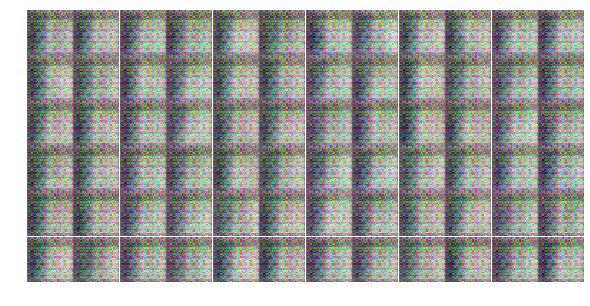

Epoch 1/3... Discriminator Loss: 0.1336... Generator Loss: 3.1164
Epoch 1/3... Discriminator Loss: 0.1041... Generator Loss: 3.5654
Epoch 1/3... Discriminator Loss: 0.8341... Generator Loss: 1.5452
Epoch 1/3... Discriminator Loss: 0.9475... Generator Loss: 1.6811
Epoch 1/3... Discriminator Loss: 0.3172... Generator Loss: 2.4474
Epoch 1/3... Discriminator Loss: 0.8038... Generator Loss: 3.0548
Epoch 1/3... Discriminator Loss: 0.1909... Generator Loss: 2.8648
Epoch 1/3... Discriminator Loss: 0.1668... Generator Loss: 3.8960
Epoch 1/3... Discriminator Loss: 0.1349... Generator Loss: 3.2121
Epoch 1/3... Discriminator Loss: 0.2332... Generator Loss: 2.1446


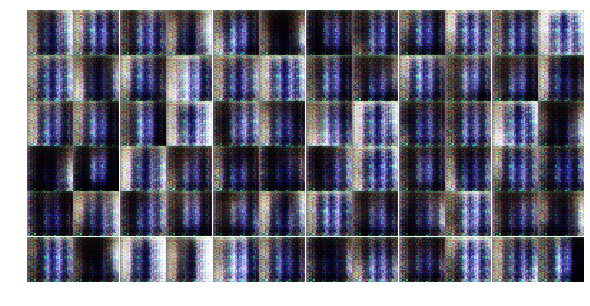

Epoch 1/3... Discriminator Loss: 1.1649... Generator Loss: 0.5168
Epoch 1/3... Discriminator Loss: 1.0088... Generator Loss: 0.7624
Epoch 1/3... Discriminator Loss: 0.4205... Generator Loss: 3.2750
Epoch 1/3... Discriminator Loss: 0.1383... Generator Loss: 3.1533
Epoch 1/3... Discriminator Loss: 0.1364... Generator Loss: 3.4961
Epoch 1/3... Discriminator Loss: 2.7756... Generator Loss: 6.4028
Epoch 1/3... Discriminator Loss: 1.2918... Generator Loss: 1.3187
Epoch 1/3... Discriminator Loss: 1.2838... Generator Loss: 1.2336
Epoch 1/3... Discriminator Loss: 0.8951... Generator Loss: 1.2958
Epoch 1/3... Discriminator Loss: 0.9236... Generator Loss: 1.0891


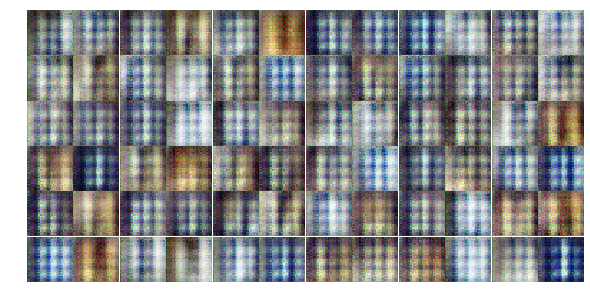

Epoch 1/3... Discriminator Loss: 1.2121... Generator Loss: 1.4465
Epoch 1/3... Discriminator Loss: 1.1817... Generator Loss: 0.8731
Epoch 1/3... Discriminator Loss: 0.5604... Generator Loss: 1.3543
Epoch 1/3... Discriminator Loss: 0.7140... Generator Loss: 1.1460
Epoch 1/3... Discriminator Loss: 0.4006... Generator Loss: 1.8000
Epoch 1/3... Discriminator Loss: 0.9347... Generator Loss: 0.9257
Epoch 1/3... Discriminator Loss: 0.6106... Generator Loss: 1.5654
Epoch 1/3... Discriminator Loss: 0.6731... Generator Loss: 1.3306
Epoch 1/3... Discriminator Loss: 0.3568... Generator Loss: 1.8961
Epoch 1/3... Discriminator Loss: 0.4395... Generator Loss: 2.1674


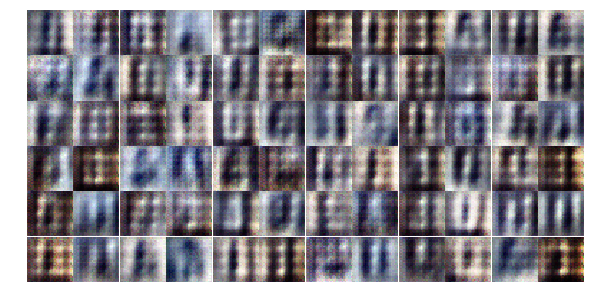

Epoch 1/3... Discriminator Loss: 0.8720... Generator Loss: 1.4314
Epoch 1/3... Discriminator Loss: 0.5226... Generator Loss: 1.8627
Epoch 1/3... Discriminator Loss: 0.8401... Generator Loss: 0.9995
Epoch 1/3... Discriminator Loss: 0.5750... Generator Loss: 1.2696
Epoch 1/3... Discriminator Loss: 0.5861... Generator Loss: 2.0164
Epoch 1/3... Discriminator Loss: 0.8044... Generator Loss: 1.3342
Epoch 1/3... Discriminator Loss: 0.6515... Generator Loss: 2.3777
Epoch 1/3... Discriminator Loss: 1.0751... Generator Loss: 2.0872
Epoch 1/3... Discriminator Loss: 2.7529... Generator Loss: 0.1484
Epoch 1/3... Discriminator Loss: 0.8399... Generator Loss: 1.0857


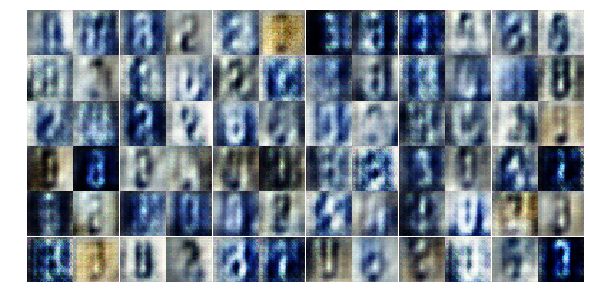

Epoch 1/3... Discriminator Loss: 1.3560... Generator Loss: 2.3165
Epoch 1/3... Discriminator Loss: 1.5939... Generator Loss: 0.6888
Epoch 1/3... Discriminator Loss: 1.0648... Generator Loss: 0.8339
Epoch 1/3... Discriminator Loss: 0.8243... Generator Loss: 1.1563
Epoch 1/3... Discriminator Loss: 1.0540... Generator Loss: 1.1635
Epoch 1/3... Discriminator Loss: 0.7605... Generator Loss: 1.1965
Epoch 1/3... Discriminator Loss: 0.7577... Generator Loss: 1.3492
Epoch 1/3... Discriminator Loss: 0.8591... Generator Loss: 1.1869
Epoch 1/3... Discriminator Loss: 1.0822... Generator Loss: 1.5270
Epoch 1/3... Discriminator Loss: 1.0958... Generator Loss: 0.8958


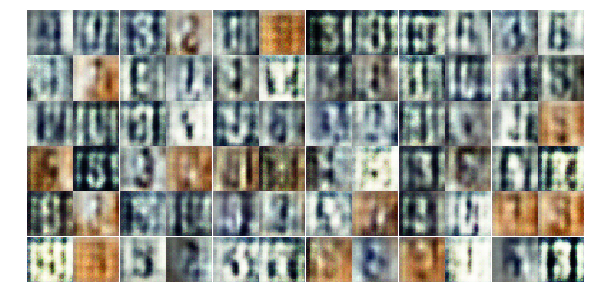

Epoch 1/3... Discriminator Loss: 0.8182... Generator Loss: 1.1980
Epoch 1/3... Discriminator Loss: 0.9843... Generator Loss: 1.2447
Epoch 1/3... Discriminator Loss: 0.9476... Generator Loss: 0.9722
Epoch 1/3... Discriminator Loss: 0.8047... Generator Loss: 1.1823
Epoch 1/3... Discriminator Loss: 0.8843... Generator Loss: 1.2709
Epoch 1/3... Discriminator Loss: 1.0360... Generator Loss: 0.9753
Epoch 1/3... Discriminator Loss: 1.0419... Generator Loss: 0.7915
Epoch 1/3... Discriminator Loss: 1.7854... Generator Loss: 0.3448
Epoch 1/3... Discriminator Loss: 1.8416... Generator Loss: 0.5636
Epoch 1/3... Discriminator Loss: 1.1412... Generator Loss: 0.8986


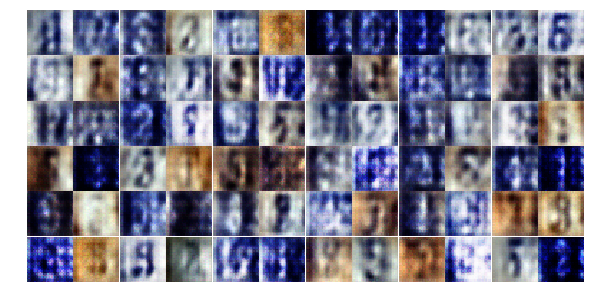

Epoch 1/3... Discriminator Loss: 1.6067... Generator Loss: 0.3717
Epoch 1/3... Discriminator Loss: 1.1982... Generator Loss: 1.0708
Epoch 1/3... Discriminator Loss: 0.8698... Generator Loss: 1.0166
Epoch 1/3... Discriminator Loss: 1.3158... Generator Loss: 0.6719
Epoch 1/3... Discriminator Loss: 1.2730... Generator Loss: 0.7222
Epoch 1/3... Discriminator Loss: 0.8815... Generator Loss: 0.9957
Epoch 1/3... Discriminator Loss: 0.9865... Generator Loss: 0.9350
Epoch 1/3... Discriminator Loss: 0.6694... Generator Loss: 1.6012
Epoch 1/3... Discriminator Loss: 0.8802... Generator Loss: 1.1936
Epoch 1/3... Discriminator Loss: 1.0551... Generator Loss: 0.9130


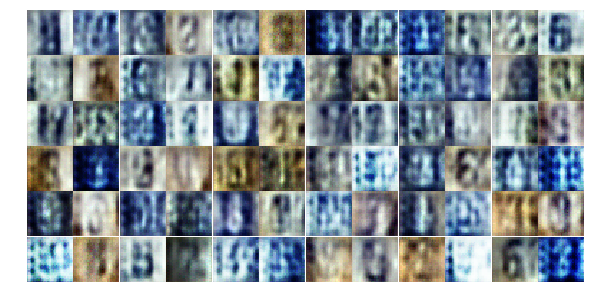

Epoch 1/3... Discriminator Loss: 1.2245... Generator Loss: 0.9475
Epoch 1/3... Discriminator Loss: 0.9001... Generator Loss: 1.0244
Epoch 1/3... Discriminator Loss: 1.1765... Generator Loss: 0.8344
Epoch 1/3... Discriminator Loss: 0.9829... Generator Loss: 0.9890
Epoch 1/3... Discriminator Loss: 1.1636... Generator Loss: 0.9672
Epoch 1/3... Discriminator Loss: 1.1078... Generator Loss: 0.9732
Epoch 1/3... Discriminator Loss: 1.2908... Generator Loss: 0.7225
Epoch 1/3... Discriminator Loss: 1.0436... Generator Loss: 1.0031
Epoch 1/3... Discriminator Loss: 1.2720... Generator Loss: 0.6589
Epoch 1/3... Discriminator Loss: 1.0125... Generator Loss: 0.9395


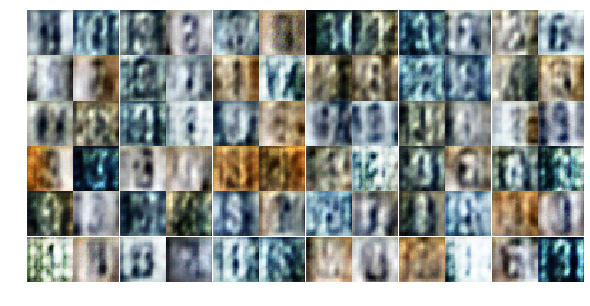

Epoch 1/3... Discriminator Loss: 1.1692... Generator Loss: 0.9223
Epoch 1/3... Discriminator Loss: 1.1750... Generator Loss: 0.7973
Epoch 1/3... Discriminator Loss: 0.9776... Generator Loss: 0.9975
Epoch 1/3... Discriminator Loss: 0.8805... Generator Loss: 1.1632
Epoch 1/3... Discriminator Loss: 1.0305... Generator Loss: 0.9291
Epoch 1/3... Discriminator Loss: 1.0616... Generator Loss: 0.9137
Epoch 1/3... Discriminator Loss: 1.0175... Generator Loss: 1.3813
Epoch 1/3... Discriminator Loss: 1.2039... Generator Loss: 0.9298
Epoch 1/3... Discriminator Loss: 1.6108... Generator Loss: 0.7709
Epoch 1/3... Discriminator Loss: 1.8556... Generator Loss: 0.4155


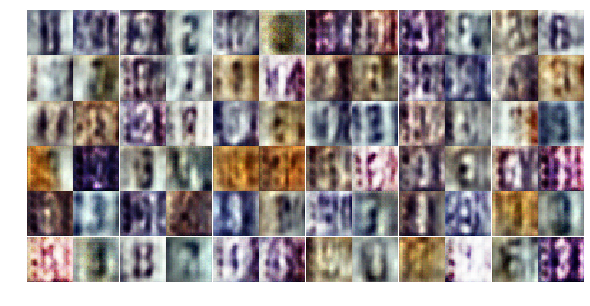

Epoch 1/3... Discriminator Loss: 1.3175... Generator Loss: 0.8365
Epoch 1/3... Discriminator Loss: 1.1485... Generator Loss: 0.7693
Epoch 1/3... Discriminator Loss: 1.1678... Generator Loss: 0.7327
Epoch 1/3... Discriminator Loss: 1.0686... Generator Loss: 0.9736
Epoch 1/3... Discriminator Loss: 1.0075... Generator Loss: 0.9990
Epoch 1/3... Discriminator Loss: 1.1069... Generator Loss: 0.7902
Epoch 1/3... Discriminator Loss: 1.4858... Generator Loss: 0.5391
Epoch 1/3... Discriminator Loss: 1.7619... Generator Loss: 0.4821
Epoch 1/3... Discriminator Loss: 1.2809... Generator Loss: 0.7569
Epoch 1/3... Discriminator Loss: 1.2461... Generator Loss: 0.7012


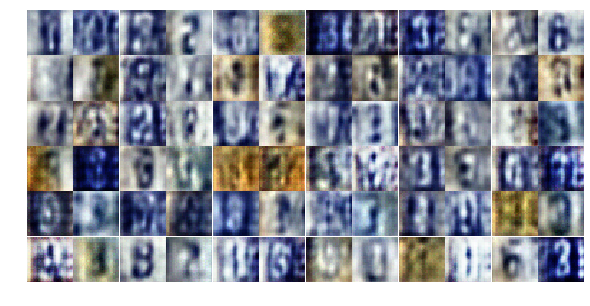

Epoch 1/3... Discriminator Loss: 1.1859... Generator Loss: 0.8390
Epoch 1/3... Discriminator Loss: 1.0894... Generator Loss: 0.9307
Epoch 1/3... Discriminator Loss: 1.1935... Generator Loss: 0.8611
Epoch 1/3... Discriminator Loss: 1.2533... Generator Loss: 0.7002
Epoch 2/3... Discriminator Loss: 0.9287... Generator Loss: 1.0658
Epoch 2/3... Discriminator Loss: 1.1050... Generator Loss: 0.8207
Epoch 2/3... Discriminator Loss: 0.8946... Generator Loss: 1.3201
Epoch 2/3... Discriminator Loss: 1.0635... Generator Loss: 0.9590
Epoch 2/3... Discriminator Loss: 1.1958... Generator Loss: 0.7267
Epoch 2/3... Discriminator Loss: 1.1343... Generator Loss: 0.7662


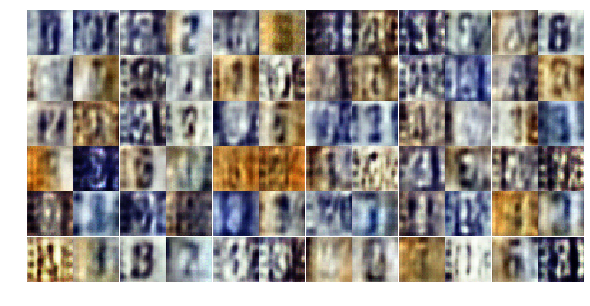

Epoch 2/3... Discriminator Loss: 1.0078... Generator Loss: 1.0496
Epoch 2/3... Discriminator Loss: 0.7885... Generator Loss: 1.1392
Epoch 2/3... Discriminator Loss: 1.0906... Generator Loss: 0.7271
Epoch 2/3... Discriminator Loss: 0.9873... Generator Loss: 1.0326
Epoch 2/3... Discriminator Loss: 1.0039... Generator Loss: 0.8801
Epoch 2/3... Discriminator Loss: 1.2402... Generator Loss: 0.7408
Epoch 2/3... Discriminator Loss: 1.4589... Generator Loss: 0.5784
Epoch 2/3... Discriminator Loss: 1.1879... Generator Loss: 0.8057
Epoch 2/3... Discriminator Loss: 1.4435... Generator Loss: 0.6905
Epoch 2/3... Discriminator Loss: 1.0632... Generator Loss: 0.9366


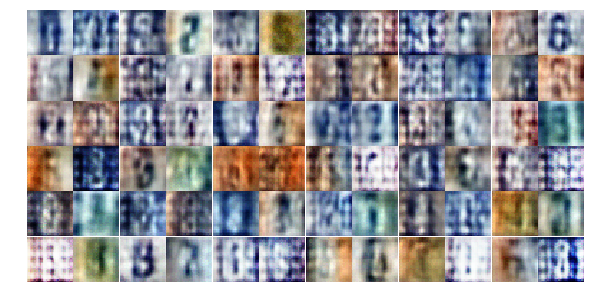

Epoch 2/3... Discriminator Loss: 1.1005... Generator Loss: 1.2114
Epoch 2/3... Discriminator Loss: 0.9214... Generator Loss: 1.3782
Epoch 2/3... Discriminator Loss: 0.9921... Generator Loss: 0.8953
Epoch 2/3... Discriminator Loss: 0.6871... Generator Loss: 1.4312
Epoch 2/3... Discriminator Loss: 0.9229... Generator Loss: 0.8724
Epoch 2/3... Discriminator Loss: 1.6371... Generator Loss: 0.4812
Epoch 2/3... Discriminator Loss: 1.0512... Generator Loss: 0.9598
Epoch 2/3... Discriminator Loss: 0.8535... Generator Loss: 0.9159
Epoch 2/3... Discriminator Loss: 0.9293... Generator Loss: 0.8616
Epoch 2/3... Discriminator Loss: 0.9640... Generator Loss: 0.9293


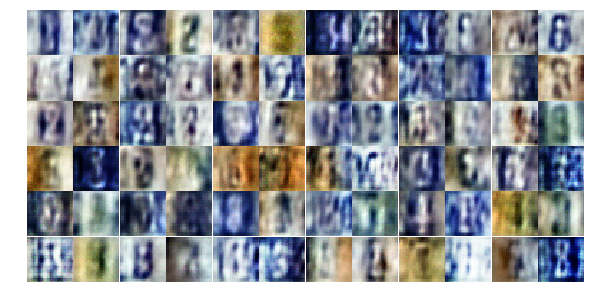

Epoch 2/3... Discriminator Loss: 0.8232... Generator Loss: 1.5086
Epoch 2/3... Discriminator Loss: 0.9152... Generator Loss: 1.6858
Epoch 2/3... Discriminator Loss: 1.0255... Generator Loss: 1.1599
Epoch 2/3... Discriminator Loss: 1.1809... Generator Loss: 0.9176
Epoch 2/3... Discriminator Loss: 0.6493... Generator Loss: 1.1618
Epoch 2/3... Discriminator Loss: 0.7096... Generator Loss: 1.6954
Epoch 2/3... Discriminator Loss: 1.1465... Generator Loss: 0.9230
Epoch 2/3... Discriminator Loss: 1.3628... Generator Loss: 0.7942
Epoch 2/3... Discriminator Loss: 0.8291... Generator Loss: 1.1814
Epoch 2/3... Discriminator Loss: 1.1654... Generator Loss: 0.6512


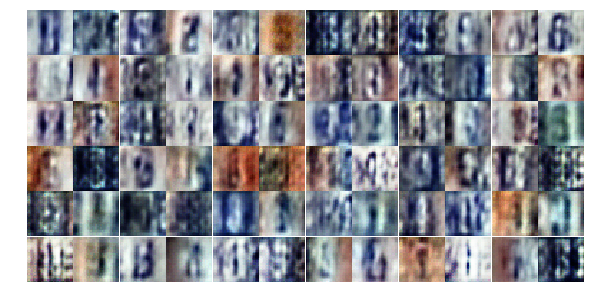

Epoch 2/3... Discriminator Loss: 0.9773... Generator Loss: 2.1729
Epoch 2/3... Discriminator Loss: 0.5213... Generator Loss: 1.9260
Epoch 2/3... Discriminator Loss: 1.0447... Generator Loss: 0.6468
Epoch 2/3... Discriminator Loss: 0.5845... Generator Loss: 1.4595
Epoch 2/3... Discriminator Loss: 0.8562... Generator Loss: 1.2595
Epoch 2/3... Discriminator Loss: 0.7242... Generator Loss: 1.2731
Epoch 2/3... Discriminator Loss: 1.0213... Generator Loss: 0.8030
Epoch 2/3... Discriminator Loss: 0.7907... Generator Loss: 1.0251
Epoch 2/3... Discriminator Loss: 0.6226... Generator Loss: 1.2879
Epoch 2/3... Discriminator Loss: 1.6892... Generator Loss: 0.3591


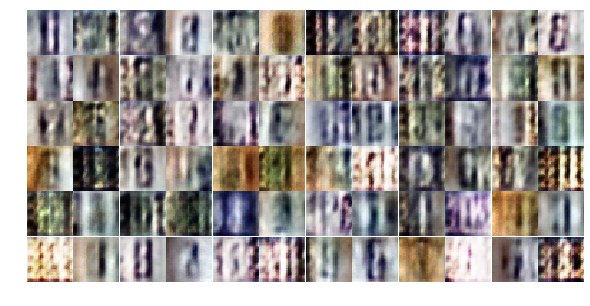

Epoch 2/3... Discriminator Loss: 0.5730... Generator Loss: 1.1297
Epoch 2/3... Discriminator Loss: 0.9271... Generator Loss: 0.7905
Epoch 2/3... Discriminator Loss: 0.7528... Generator Loss: 1.1345
Epoch 2/3... Discriminator Loss: 0.8943... Generator Loss: 1.9619
Epoch 2/3... Discriminator Loss: 0.5521... Generator Loss: 1.8570
Epoch 2/3... Discriminator Loss: 0.8942... Generator Loss: 0.9714
Epoch 2/3... Discriminator Loss: 0.6900... Generator Loss: 1.0810
Epoch 2/3... Discriminator Loss: 0.5581... Generator Loss: 1.2976
Epoch 2/3... Discriminator Loss: 0.4336... Generator Loss: 1.9221
Epoch 2/3... Discriminator Loss: 0.7933... Generator Loss: 1.1038


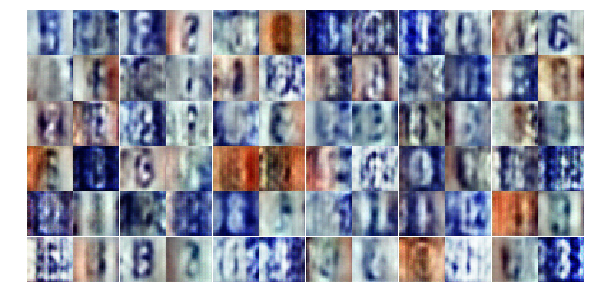

Epoch 2/3... Discriminator Loss: 0.4780... Generator Loss: 2.2201
Epoch 2/3... Discriminator Loss: 0.7406... Generator Loss: 1.5848
Epoch 2/3... Discriminator Loss: 0.9918... Generator Loss: 0.7061
Epoch 2/3... Discriminator Loss: 1.3836... Generator Loss: 0.4404
Epoch 2/3... Discriminator Loss: 0.7643... Generator Loss: 1.4997
Epoch 2/3... Discriminator Loss: 0.5442... Generator Loss: 2.0484
Epoch 2/3... Discriminator Loss: 0.4652... Generator Loss: 1.6465
Epoch 2/3... Discriminator Loss: 0.5994... Generator Loss: 1.2181
Epoch 2/3... Discriminator Loss: 0.8885... Generator Loss: 0.8427
Epoch 2/3... Discriminator Loss: 0.4958... Generator Loss: 1.3135


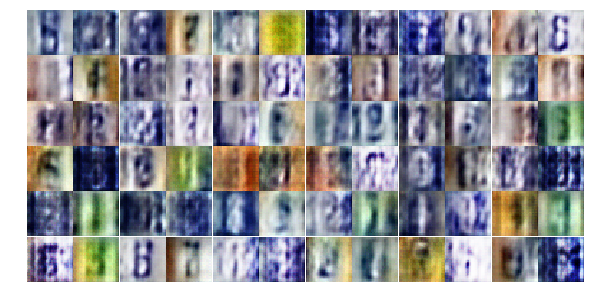

Epoch 2/3... Discriminator Loss: 0.8263... Generator Loss: 0.8139
Epoch 2/3... Discriminator Loss: 0.9570... Generator Loss: 0.8960
Epoch 2/3... Discriminator Loss: 0.5961... Generator Loss: 1.2665
Epoch 2/3... Discriminator Loss: 1.0016... Generator Loss: 0.9001
Epoch 2/3... Discriminator Loss: 0.8451... Generator Loss: 1.9939
Epoch 2/3... Discriminator Loss: 0.6318... Generator Loss: 1.1934
Epoch 2/3... Discriminator Loss: 0.9545... Generator Loss: 0.7959
Epoch 2/3... Discriminator Loss: 1.1255... Generator Loss: 0.5480
Epoch 2/3... Discriminator Loss: 0.8740... Generator Loss: 0.9252
Epoch 2/3... Discriminator Loss: 0.3498... Generator Loss: 1.9159


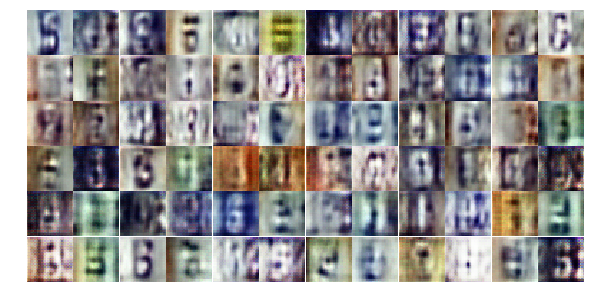

Epoch 2/3... Discriminator Loss: 1.4093... Generator Loss: 0.4140
Epoch 2/3... Discriminator Loss: 0.8968... Generator Loss: 0.9059
Epoch 2/3... Discriminator Loss: 0.6747... Generator Loss: 1.3710
Epoch 2/3... Discriminator Loss: 0.8234... Generator Loss: 1.2496
Epoch 2/3... Discriminator Loss: 0.9990... Generator Loss: 0.6512
Epoch 2/3... Discriminator Loss: 0.7549... Generator Loss: 1.0482
Epoch 2/3... Discriminator Loss: 0.6538... Generator Loss: 1.2530
Epoch 2/3... Discriminator Loss: 0.7589... Generator Loss: 1.4356
Epoch 2/3... Discriminator Loss: 0.5946... Generator Loss: 1.7949
Epoch 2/3... Discriminator Loss: 0.5021... Generator Loss: 1.4242


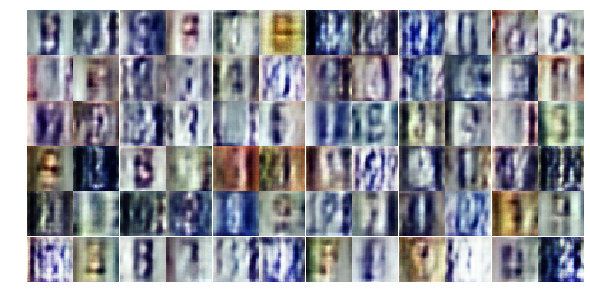

Epoch 2/3... Discriminator Loss: 0.4306... Generator Loss: 1.8562
Epoch 2/3... Discriminator Loss: 1.0439... Generator Loss: 0.7245
Epoch 2/3... Discriminator Loss: 0.5401... Generator Loss: 1.7242
Epoch 2/3... Discriminator Loss: 0.7120... Generator Loss: 1.3827
Epoch 2/3... Discriminator Loss: 0.9922... Generator Loss: 0.7200
Epoch 2/3... Discriminator Loss: 0.9538... Generator Loss: 0.8347
Epoch 2/3... Discriminator Loss: 0.6263... Generator Loss: 1.7400
Epoch 2/3... Discriminator Loss: 1.3929... Generator Loss: 0.4178
Epoch 2/3... Discriminator Loss: 1.2219... Generator Loss: 0.5368
Epoch 2/3... Discriminator Loss: 0.4664... Generator Loss: 1.9774


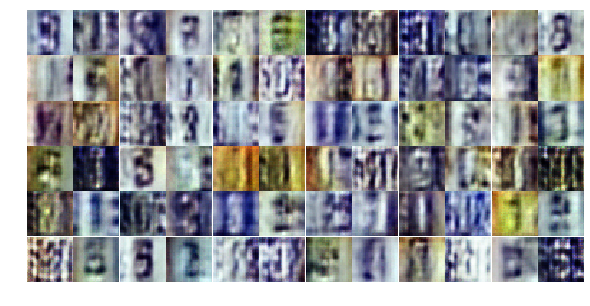

Epoch 2/3... Discriminator Loss: 1.0671... Generator Loss: 0.6980
Epoch 2/3... Discriminator Loss: 0.9828... Generator Loss: 0.9523
Epoch 2/3... Discriminator Loss: 0.5262... Generator Loss: 1.9282
Epoch 2/3... Discriminator Loss: 1.2875... Generator Loss: 0.5249
Epoch 2/3... Discriminator Loss: 1.4021... Generator Loss: 0.3642
Epoch 2/3... Discriminator Loss: 0.9624... Generator Loss: 0.9398
Epoch 2/3... Discriminator Loss: 0.6772... Generator Loss: 1.2329
Epoch 2/3... Discriminator Loss: 0.9126... Generator Loss: 0.9330
Epoch 2/3... Discriminator Loss: 0.7800... Generator Loss: 0.9604
Epoch 2/3... Discriminator Loss: 0.7596... Generator Loss: 1.7335


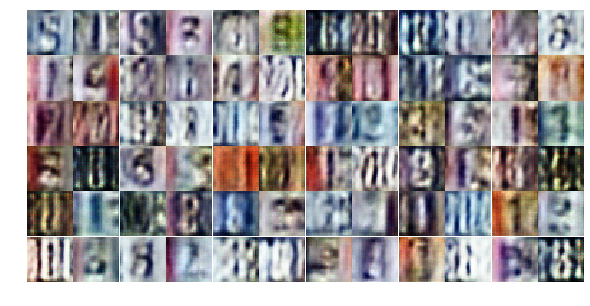

Epoch 2/3... Discriminator Loss: 0.9420... Generator Loss: 0.8681
Epoch 2/3... Discriminator Loss: 0.6541... Generator Loss: 1.6520
Epoch 2/3... Discriminator Loss: 0.7106... Generator Loss: 1.2233
Epoch 2/3... Discriminator Loss: 0.4477... Generator Loss: 1.4724
Epoch 2/3... Discriminator Loss: 0.7928... Generator Loss: 1.0467
Epoch 2/3... Discriminator Loss: 0.8363... Generator Loss: 1.1707
Epoch 2/3... Discriminator Loss: 0.9763... Generator Loss: 0.8222
Epoch 2/3... Discriminator Loss: 0.8202... Generator Loss: 0.8814
Epoch 2/3... Discriminator Loss: 0.6609... Generator Loss: 1.8370
Epoch 3/3... Discriminator Loss: 1.0588... Generator Loss: 0.8354


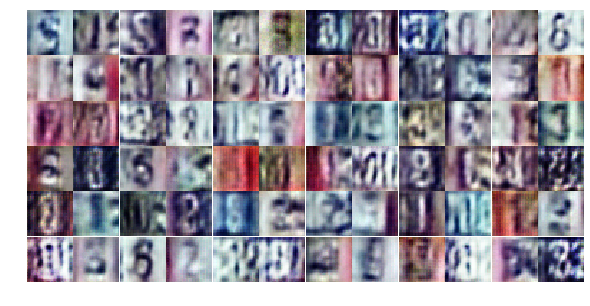

Epoch 3/3... Discriminator Loss: 0.6048... Generator Loss: 1.3096
Epoch 3/3... Discriminator Loss: 0.4642... Generator Loss: 1.5906
Epoch 3/3... Discriminator Loss: 0.9202... Generator Loss: 0.6880
Epoch 3/3... Discriminator Loss: 0.2686... Generator Loss: 1.9752
Epoch 3/3... Discriminator Loss: 0.5629... Generator Loss: 1.6018
Epoch 3/3... Discriminator Loss: 0.6353... Generator Loss: 2.4527
Epoch 3/3... Discriminator Loss: 0.5746... Generator Loss: 1.9315
Epoch 3/3... Discriminator Loss: 1.0313... Generator Loss: 0.6931
Epoch 3/3... Discriminator Loss: 1.3017... Generator Loss: 0.5809
Epoch 3/3... Discriminator Loss: 1.2021... Generator Loss: 0.4935


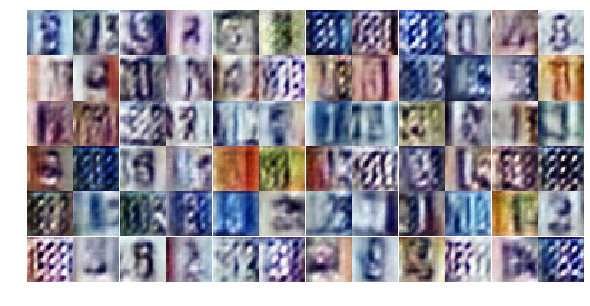

Epoch 3/3... Discriminator Loss: 0.6655... Generator Loss: 1.1181
Epoch 3/3... Discriminator Loss: 0.8498... Generator Loss: 0.8138
Epoch 3/3... Discriminator Loss: 0.7631... Generator Loss: 1.9934
Epoch 3/3... Discriminator Loss: 0.8489... Generator Loss: 0.8029
Epoch 3/3... Discriminator Loss: 0.4238... Generator Loss: 2.1107
Epoch 3/3... Discriminator Loss: 0.6261... Generator Loss: 2.5055
Epoch 3/3... Discriminator Loss: 0.9574... Generator Loss: 0.8190
Epoch 3/3... Discriminator Loss: 0.7073... Generator Loss: 1.2114
Epoch 3/3... Discriminator Loss: 0.6075... Generator Loss: 1.1634
Epoch 3/3... Discriminator Loss: 1.2540... Generator Loss: 0.5166


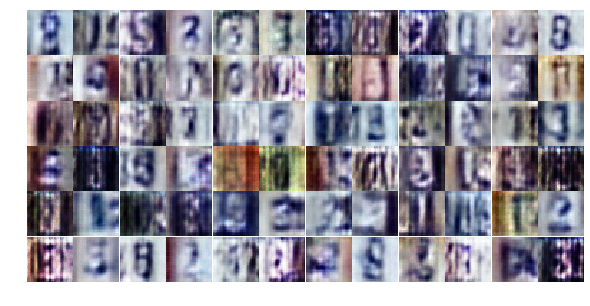

Epoch 3/3... Discriminator Loss: 0.7956... Generator Loss: 0.9168
Epoch 3/3... Discriminator Loss: 0.5577... Generator Loss: 1.4656
Epoch 3/3... Discriminator Loss: 0.3995... Generator Loss: 2.0075
Epoch 3/3... Discriminator Loss: 1.0042... Generator Loss: 0.6320
Epoch 3/3... Discriminator Loss: 1.2176... Generator Loss: 0.5029
Epoch 3/3... Discriminator Loss: 0.6118... Generator Loss: 1.2799
Epoch 3/3... Discriminator Loss: 0.5622... Generator Loss: 1.3590
Epoch 3/3... Discriminator Loss: 1.0275... Generator Loss: 0.8263
Epoch 3/3... Discriminator Loss: 0.5664... Generator Loss: 1.3558
Epoch 3/3... Discriminator Loss: 0.6222... Generator Loss: 1.0572


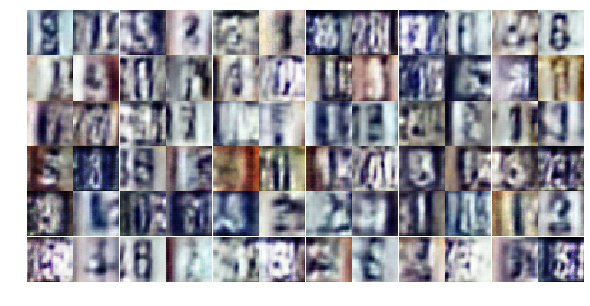

Epoch 3/3... Discriminator Loss: 0.5458... Generator Loss: 1.5533
Epoch 3/3... Discriminator Loss: 0.4834... Generator Loss: 1.9347
Epoch 3/3... Discriminator Loss: 0.6892... Generator Loss: 1.1486
Epoch 3/3... Discriminator Loss: 0.7142... Generator Loss: 0.8953
Epoch 3/3... Discriminator Loss: 0.6002... Generator Loss: 1.1250
Epoch 3/3... Discriminator Loss: 0.4262... Generator Loss: 1.5912
Epoch 3/3... Discriminator Loss: 0.6922... Generator Loss: 1.1051
Epoch 3/3... Discriminator Loss: 0.5009... Generator Loss: 1.8464
Epoch 3/3... Discriminator Loss: 0.4816... Generator Loss: 2.5469
Epoch 3/3... Discriminator Loss: 0.4869... Generator Loss: 1.4110


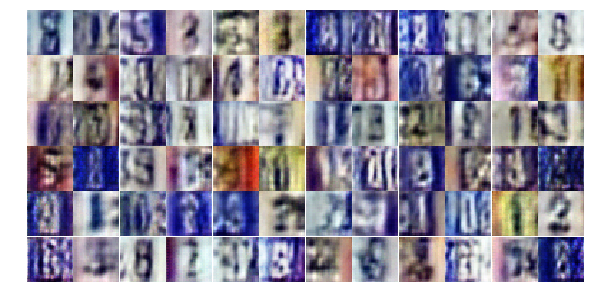

Epoch 3/3... Discriminator Loss: 0.3241... Generator Loss: 2.5335
Epoch 3/3... Discriminator Loss: 0.5001... Generator Loss: 1.4259
Epoch 3/3... Discriminator Loss: 0.5928... Generator Loss: 1.1142
Epoch 3/3... Discriminator Loss: 0.6260... Generator Loss: 1.1095
Epoch 3/3... Discriminator Loss: 0.4548... Generator Loss: 1.4311
Epoch 3/3... Discriminator Loss: 0.8671... Generator Loss: 0.8653
Epoch 3/3... Discriminator Loss: 0.7730... Generator Loss: 1.0989
Epoch 3/3... Discriminator Loss: 0.6076... Generator Loss: 1.1296
Epoch 3/3... Discriminator Loss: 0.5734... Generator Loss: 1.3234
Epoch 3/3... Discriminator Loss: 0.5980... Generator Loss: 1.3778


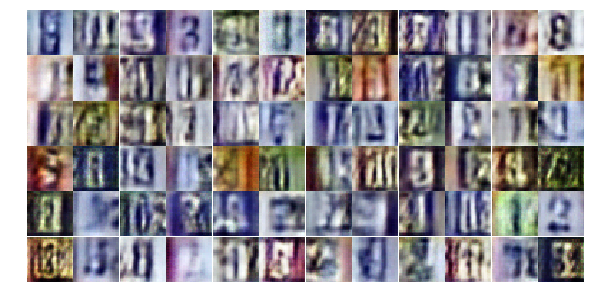

Epoch 3/3... Discriminator Loss: 0.2845... Generator Loss: 3.0591
Epoch 3/3... Discriminator Loss: 0.8170... Generator Loss: 1.3024
Epoch 3/3... Discriminator Loss: 0.7026... Generator Loss: 1.6490
Epoch 3/3... Discriminator Loss: 0.4450... Generator Loss: 1.6617
Epoch 3/3... Discriminator Loss: 0.4887... Generator Loss: 1.8198
Epoch 3/3... Discriminator Loss: 0.8505... Generator Loss: 0.9773
Epoch 3/3... Discriminator Loss: 0.6191... Generator Loss: 1.0823
Epoch 3/3... Discriminator Loss: 0.6607... Generator Loss: 2.0285
Epoch 3/3... Discriminator Loss: 0.5665... Generator Loss: 1.6307
Epoch 3/3... Discriminator Loss: 0.6774... Generator Loss: 1.0050


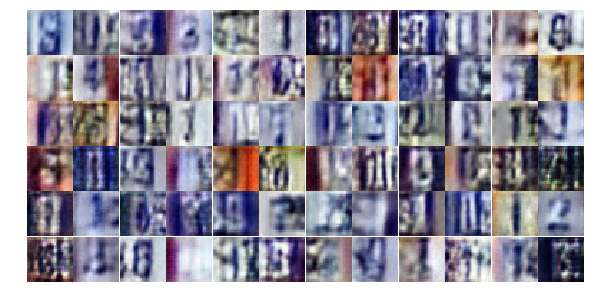

Epoch 3/3... Discriminator Loss: 0.6958... Generator Loss: 1.0395
Epoch 3/3... Discriminator Loss: 0.4600... Generator Loss: 1.7463
Epoch 3/3... Discriminator Loss: 0.8416... Generator Loss: 0.7671
Epoch 3/3... Discriminator Loss: 0.6880... Generator Loss: 1.1517
Epoch 3/3... Discriminator Loss: 0.4545... Generator Loss: 1.5800
Epoch 3/3... Discriminator Loss: 0.6901... Generator Loss: 1.2281
Epoch 3/3... Discriminator Loss: 0.6394... Generator Loss: 1.5605
Epoch 3/3... Discriminator Loss: 0.8046... Generator Loss: 0.8785
Epoch 3/3... Discriminator Loss: 1.0739... Generator Loss: 0.5892
Epoch 3/3... Discriminator Loss: 1.2224... Generator Loss: 0.5925


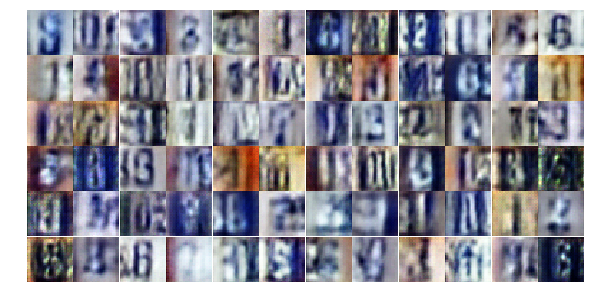

Epoch 3/3... Discriminator Loss: 0.6914... Generator Loss: 1.2670
Epoch 3/3... Discriminator Loss: 1.1460... Generator Loss: 0.5700
Epoch 3/3... Discriminator Loss: 0.2399... Generator Loss: 2.5462
Epoch 3/3... Discriminator Loss: 0.9933... Generator Loss: 0.6093
Epoch 3/3... Discriminator Loss: 0.8925... Generator Loss: 0.9075
Epoch 3/3... Discriminator Loss: 1.4253... Generator Loss: 0.4140
Epoch 3/3... Discriminator Loss: 0.3308... Generator Loss: 2.7082
Epoch 3/3... Discriminator Loss: 1.1445... Generator Loss: 0.5592
Epoch 3/3... Discriminator Loss: 0.4894... Generator Loss: 2.0250
Epoch 3/3... Discriminator Loss: 0.5147... Generator Loss: 1.7060


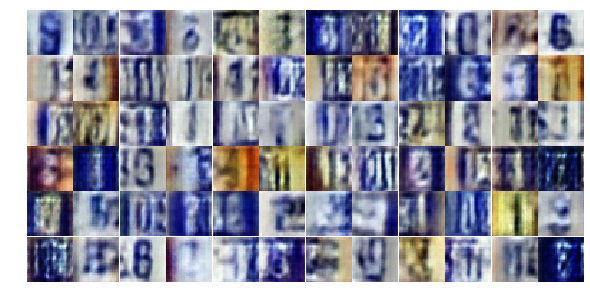

Epoch 3/3... Discriminator Loss: 0.6241... Generator Loss: 1.2317
Epoch 3/3... Discriminator Loss: 0.2921... Generator Loss: 2.1294
Epoch 3/3... Discriminator Loss: 1.5792... Generator Loss: 0.3309
Epoch 3/3... Discriminator Loss: 0.6317... Generator Loss: 1.1546
Epoch 3/3... Discriminator Loss: 0.4094... Generator Loss: 2.4679
Epoch 3/3... Discriminator Loss: 1.0751... Generator Loss: 0.5708
Epoch 3/3... Discriminator Loss: 0.3610... Generator Loss: 1.9850
Epoch 3/3... Discriminator Loss: 1.5224... Generator Loss: 0.3233
Epoch 3/3... Discriminator Loss: 0.6739... Generator Loss: 1.2611
Epoch 3/3... Discriminator Loss: 0.8953... Generator Loss: 0.8398


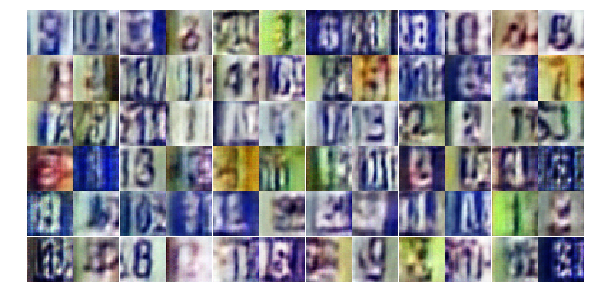

Epoch 3/3... Discriminator Loss: 0.7402... Generator Loss: 1.7170
Epoch 3/3... Discriminator Loss: 1.2849... Generator Loss: 0.5095
Epoch 3/3... Discriminator Loss: 0.6289... Generator Loss: 1.5282
Epoch 3/3... Discriminator Loss: 0.7018... Generator Loss: 0.8797
Epoch 3/3... Discriminator Loss: 0.5872... Generator Loss: 1.2914
Epoch 3/3... Discriminator Loss: 0.4850... Generator Loss: 1.4438
Epoch 3/3... Discriminator Loss: 0.6295... Generator Loss: 1.0953
Epoch 3/3... Discriminator Loss: 0.6706... Generator Loss: 1.2132
Epoch 3/3... Discriminator Loss: 1.0103... Generator Loss: 0.6450
Epoch 3/3... Discriminator Loss: 0.7064... Generator Loss: 1.2936


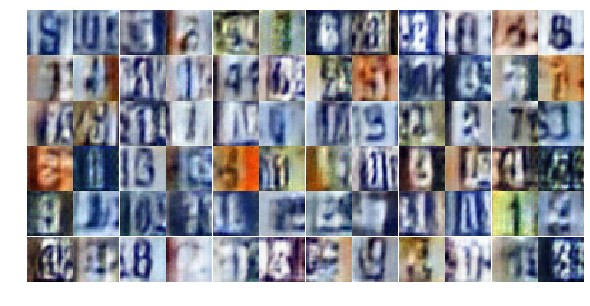

Epoch 3/3... Discriminator Loss: 0.4578... Generator Loss: 1.7211
Epoch 3/3... Discriminator Loss: 0.6435... Generator Loss: 1.6155
Epoch 3/3... Discriminator Loss: 0.5963... Generator Loss: 1.4414
Epoch 3/3... Discriminator Loss: 0.5208... Generator Loss: 1.5840
Epoch 3/3... Discriminator Loss: 0.8357... Generator Loss: 0.8132
Epoch 3/3... Discriminator Loss: 0.7642... Generator Loss: 1.5134
Epoch 3/3... Discriminator Loss: 0.7873... Generator Loss: 0.9461
Epoch 3/3... Discriminator Loss: 0.6682... Generator Loss: 1.1850
Epoch 3/3... Discriminator Loss: 0.7044... Generator Loss: 1.0005
Epoch 3/3... Discriminator Loss: 0.7365... Generator Loss: 0.8975


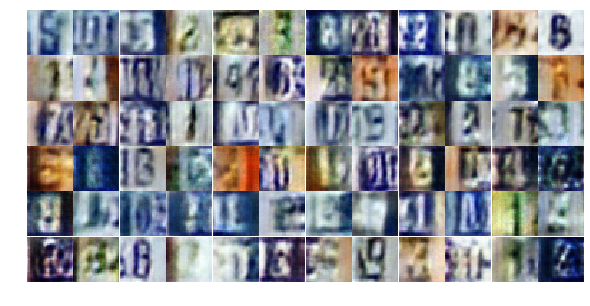

Epoch 3/3... Discriminator Loss: 0.9965... Generator Loss: 0.6149
Epoch 3/3... Discriminator Loss: 0.4858... Generator Loss: 1.4135
Epoch 3/3... Discriminator Loss: 0.6607... Generator Loss: 1.0399


In [30]:
# Load the data and train the network here
dataset = Dataset(trainset, testset)
losses, samples = train(net, dataset, epochs, batch_size, figsize=(10,5))

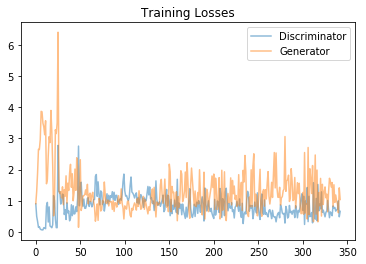

In [31]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

/usr/local/lib/python3.6/site-packages/matplotlib/axes/_base.py:1334: MatplotlibDeprecationWarning: 
box-forced
  "2.2", "box-forced", obj_type="keyword argument")


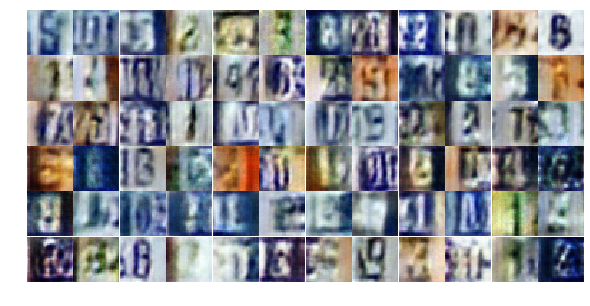

In [33]:
_ = view_samples(-1, samples, 6, 12, figsize=(10,5))